# CycleGAN
### Build CycleGAN Model
### Train  Model on pair of pictures from Dataset A and Dataset B
### Use Model to generate syntetic dataset Dataset AB

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
from keras import layers, ops
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
autotune = tf.data.AUTOTUNE

os.environ["KERAS_BACKEND"] = "tensorflow"

### Download prepared sets of pictures

I collected pictures from both datasets and prepared pairs

Now just need to dowload pictures from goodle drive

In [ ]:
!cp /content/drive/MyDrive/dissertation/datasets/dataseta.v2.tar.gz ./

In [ ]:
!cp /content/drive/MyDrive/dissertation/datasets/datasetb.v2.tar.gz ./

In [ ]:
!ls -la ./

total 460288
drwxr-xr-x 1 root root      4096 May 11 17:50 .
drwxr-xr-x 1 root root      4096 May 11 17:48 ..
drwxr-xr-x 4 root root      4096 May  8 13:38 .config
-rw------- 1 root root 320580182 May 11 17:50 dataseta.v2.tar.gz
-rw------- 1 root root 150727497 May 11 17:50 datasetb.v2.tar.gz
drwx------ 7 root root      4096 May 11 17:49 drive
drwxr-xr-x 1 root root      4096 May  8 13:38 sample_data


In [ ]:
!tar -xzf dataseta.v2.tar.gz

In [ ]:
!tar -xzf datasetb.v2.tar.gz

In [ ]:
!ls -la ./dataset/train/a/images/ | head

total 314728
drwxr-xr-x 2 root root 118784 May 11 17:44 .
drwxr-xr-x 4 root root   4096 May 11 17:43 ..
-rw-r--r-- 1 root root  98689 May 11 17:43 image_0000.png
-rw-r--r-- 1 root root  89147 May 11 17:43 image_0001.png
-rw-r--r-- 1 root root  85430 May 11 17:43 image_0002.png
-rw-r--r-- 1 root root  80871 May 11 17:43 image_0003.png
-rw-r--r-- 1 root root  97764 May 11 17:43 image_0004.png
-rw-r--r-- 1 root root 118045 May 11 17:43 image_0005.png
-rw-r--r-- 1 root root 116416 May 11 17:43 image_0006.png


### Preparing images and masks

function for loading images and masks

In [ ]:
import os
import numpy as np
from PIL import Image

def load_images(folder_path):

    image_list = []

    if not os.path.isdir(folder_path):
        return np.array([])

    filenames = sorted(os.listdir(folder_path)) # sort for consistent order

    for filename in filenames:


      img_path = os.path.join(folder_path, filename)
      try:
          with Image.open(img_path) as img:
              img_array = np.array(img)
              image_list.append(img_array)


      except Exception as e:
              print(f"Warning: Error processing image {img_path}: {e}. Skipping.")

    if not image_list:
        print("No images were successfully loaded.")
        return np.array([])

    try:
        # Stack all image arrays into a single NumPy array
        numpy_array_of_images = np.stack(image_list, axis=0)
        return numpy_array_of_images
    except ValueError as e:
        return np.array([])


### Split dataset into test/val

In [ ]:
from sklearn.model_selection import train_test_split

dataset_a = load_images('./dataset/train/a/images/')
dataset_b = load_images('./dataset/train/b/images/')

train_a, test_a, train_b, test_b = train_test_split(
    dataset_a,
    dataset_b,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

train_a =  tf.data.Dataset.from_tensor_slices(train_a)
test_a = tf.data.Dataset.from_tensor_slices(test_a)
train_b = tf.data.Dataset.from_tensor_slices(train_b)
test_b = tf.data.Dataset.from_tensor_slices(test_b)

In [4]:


input_img_size = (256, 256, 3)
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256
batch_size = 1


def normalize_img(img):
    img = ops.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0


def preprocess_train_image(img):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Random crop to 256X256
    img = tf.image.random_crop(img, size=[*input_img_size])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img


def preprocess_test_image(img):
    # Only resizing and normalization for the test images.
    img = ops.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img

In [ ]:
# Apply the preprocessing operations to the training data
train_a = (
    train_a.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
train_b = (
    train_b.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

# Apply the preprocessing operations to the test data
test_a = (
    test_a.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
test_b = (
    test_b.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

### Show samples

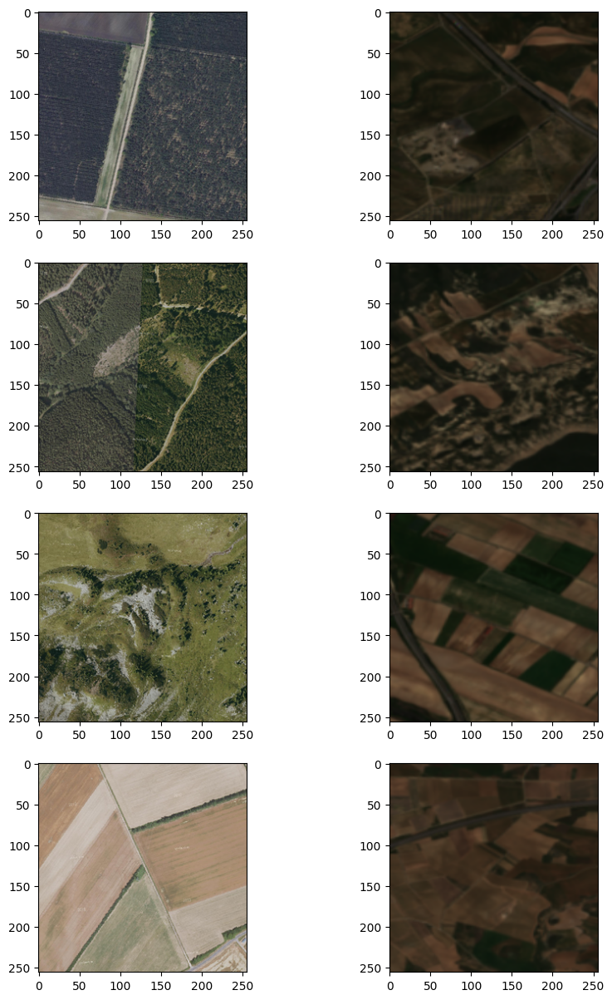

In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(train_a.take(4), train_b.take(4))):
    data_a = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    data_b = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(data_a)
    ax[i, 1].imshow(data_b)
plt.show()

## Building CycleGAN model

Create basic blocks for model

In [5]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return ops.pad(input_tensor, padding_tensor, mode="REFLECT")

# key block of resnet
def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = keras.layers.GroupNormalization(groups=1, gamma_initializer=gamma_initializer)(
        x
    )
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = keras.layers.GroupNormalization(groups=1, gamma_initializer=gamma_initializer)(
        x
    )
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = keras.layers.GroupNormalization(groups=1, gamma_initializer=gamma_initializer)(
        x
    )
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = keras.layers.GroupNormalization(groups=1, gamma_initializer=gamma_initializer)(
        x
    )
    if activation:
        x = activation(x)
    return x

### Generator for GAN

In [6]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = keras.layers.GroupNormalization(groups=1, gamma_initializer=gamma_initializer)(
        x
    )
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model

### Discrimintor for GAN

In [7]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_AB = get_resnet_generator(name="generator_AB")
gen_BA = get_resnet_generator(name="generator_BA")

# Get the discriminators
disc_A = get_discriminator(name="discriminator_A")
disc_B = get_discriminator(name="discriminator_B")

### Build CycleGAN model from bblocks

In [8]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_AB,
        generator_BA,
        discriminator_A,
        discriminator_B,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_AB = generator_AB
        self.gen_BA = generator_BA
        self.disc_A = discriminator_A
        self.disc_B = discriminator_B
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity
        if not self.gen_AB.built:
            self.gen_AB.build((None, *input_img_size))
        if not self.gen_BA.built:
            self.gen_BA.build((None, *input_img_size))
        if not self.disc_A.built:
            self.disc_A.build((None, *input_img_size))
        if not self.disc_B.built:
            self.disc_B.build((None, *input_img_size))

    def call(self, inputs):
        return (
            self.disc_A(inputs),
            self.disc_B(inputs),
            self.gen_AB(inputs),
            self.gen_BA(inputs),
        )

    def compile(
        self,
        gen_AB_optimizer,
        gen_BA_optimizer,
        disc_A_optimizer,
        disc_B_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_AB_optimizer = gen_AB_optimizer
        self.gen_BA_optimizer = gen_BA_optimizer
        self.disc_A_optimizer = disc_A_optimizer
        self.disc_B_optimizer = disc_B_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # A is crop A and B is crop B
        real_a, real_b = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adversarial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Crop_A to fake Crop_B
            fake_b = self.gen_AB(real_a, training=True)
            # Crop_B to fake Crop_A -> a2b
            fake_a = self.gen_BA(real_b, training=True)

            # Cycle (Crop_A to fake Crop_A to fake Crop_A): x -> y -> x
            cycled_a = self.gen_BA(fake_b, training=True)
            # Cycle (Crop_A to fake Crop_A to fake Crop_A) y -> x -> y
            cycled_b = self.gen_AB(fake_a, training=True)

            # Identity mapping
            same_a = self.gen_BA(real_a, training=True)
            same_b = self.gen_AB(real_b, training=True)

            # Discriminator output
            disc_real_a = self.disc_A(real_a, training=True)
            disc_fake_a = self.disc_A(fake_a, training=True)

            disc_real_b = self.disc_B(real_b, training=True)
            disc_fake_b = self.disc_B(fake_b, training=True)

            # GAN loss
            gen_AB_loss = self.generator_loss_fn(disc_fake_b)
            gen_BA_loss = self.generator_loss_fn(disc_fake_a)

            # Generator cycle loss
            cycle_loss_A = self.cycle_loss_fn(real_b, cycled_b) * self.lambda_cycle
            cycle_loss_B = self.cycle_loss_fn(real_a, cycled_a) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_b, same_b)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_a, same_a)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_A = gen_AB_loss + cycle_loss_A + id_loss_G
            total_loss_B = gen_BA_loss + cycle_loss_B + id_loss_F

            # Discriminator loss
            disc_A_loss = self.discriminator_loss_fn(disc_real_a, disc_fake_a)
            disc_B_loss = self.discriminator_loss_fn(disc_real_b, disc_fake_b)

        # Get the gradients for the generators
        grads_A = tape.gradient(total_loss_A, self.gen_AB.trainable_variables)
        grads_B = tape.gradient(total_loss_B, self.gen_BA.trainable_variables)

        # Get the gradients for the discriminators
        disc_A_grads = tape.gradient(disc_A_loss, self.disc_A.trainable_variables)
        disc_B_grads = tape.gradient(disc_B_loss, self.disc_B.trainable_variables)

        # Update the weights of the generators
        self.gen_AB_optimizer.apply_gradients(
            zip(grads_A, self.gen_AB.trainable_variables)
        )
        self.gen_BA_optimizer.apply_gradients(
            zip(grads_B, self.gen_BA.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_A_optimizer.apply_gradients(
            zip(disc_A_grads, self.disc_A.trainable_variables)
        )
        self.disc_B_optimizer.apply_gradients(
            zip(disc_B_grads, self.disc_B.trainable_variables)
        )

        return {
            "G_loss": total_loss_A,
            "F_loss": total_loss_B,
            "D_X_loss": disc_A_loss,
            "D_Y_loss": disc_B_loss,
        }

In [9]:

class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_a.take(self.num_img)):
            prediction = self.model.gen_AB(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.utils.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()


In [12]:

#Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

#loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(ops.ones_like(fake), fake)
    return fake_loss


#loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(ops.ones_like(real), real)
    fake_loss = adv_loss_fn(ops.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_AB=gen_AB, generator_BA=gen_BA, discriminator_A=disc_A, discriminator_B=disc_B
)


IMG_HEIGHT=256
IMG_WIDTH=256
IMG_CHANNELS=3


cycle_gan_input_shape = (
    (None, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS),  # Input shape for domain X (e.g., Crop_A)
    (None, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)   # Input shape for domain Y (e.g., Crop_B)
)

cycle_gan_model.build(input_shape=cycle_gan_input_shape)

# Compile the model
cycle_gan_model.compile(
    gen_AB_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_BA_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_A_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_B_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)


# Callbacks
plotter = GANMonitor()

#save weights
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.weights.h5"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, save_weights_only=True
)



In [13]:
cycle_gan_model.summary()

Model: "cycle_gan_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ generator_AB (Functional)       │ (None, 256, 256, 3)    │    11,383,427 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ generator_BA (Functional)       │ (None, 256, 256, 3)    │    11,383,427 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ discriminator_A (Functional)    │ (None, 32, 32, 1)      │     2,765,633 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ discriminator_B (Functional)    │ (None, 32, 32, 1)      │     2,765,633 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,298,120 (107.95 MB)

 Trainable params: 28,298,120 (107.95 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
train_combined_ds = tf.data.Dataset.zip((train_a, train_b))

# inputs = (images_a, images_b)
# targets = None (since CycleGAN handles targets/losses internally)
train_fit_ds = train_combined_ds.map(lambda img_a, img_b: ((img_a, img_b), None))

## Training

Epoch 1/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - D_X_loss: 0.1171 - D_Y_loss: 0.2486 - F_loss: 3.5246 - G_loss: 1.3036

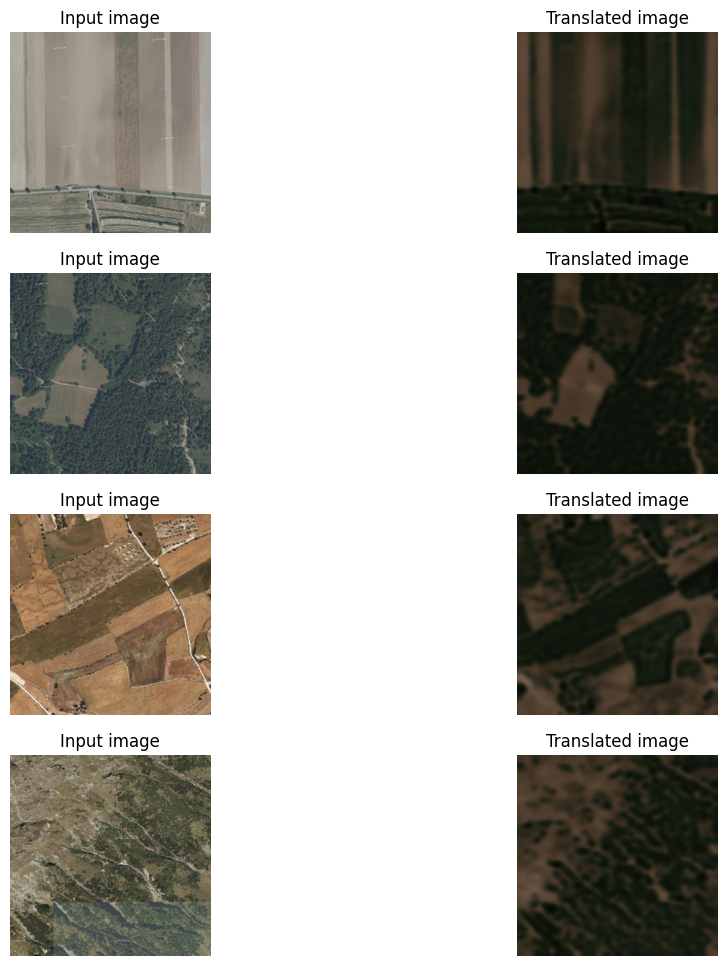

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 241s 71ms/step - D_X_loss: 0.1170 - D_Y_loss: 0.2487 - F_loss: 3.5247 - G_loss: 1.3039
Epoch 2/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.1534 - D_Y_loss: 0.2495 - F_loss: 3.1762 - G_loss: 1.0057

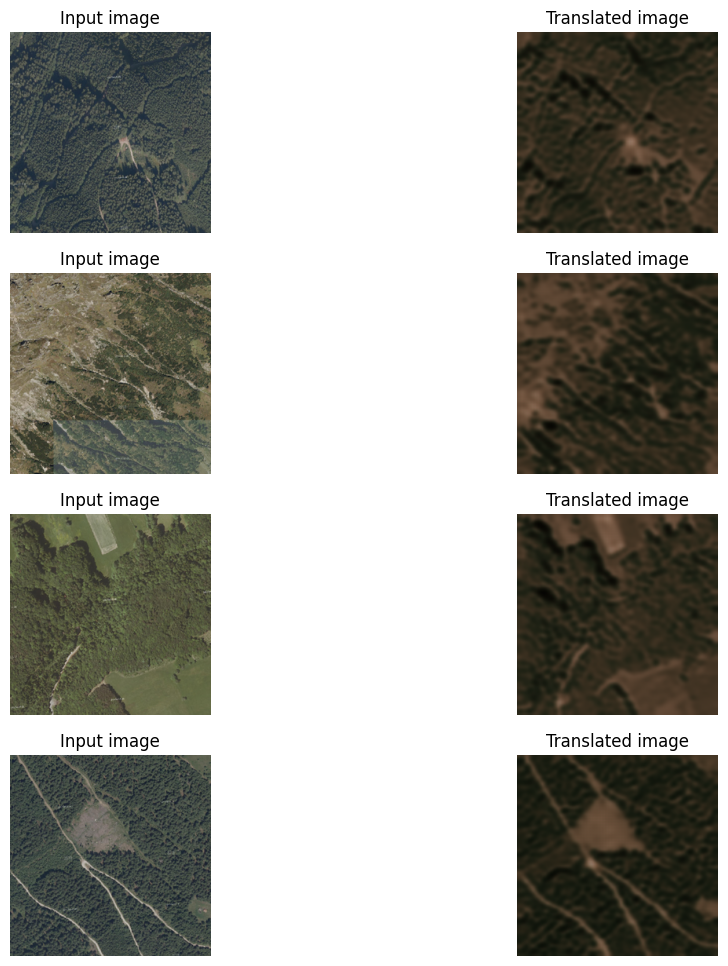

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.1535 - D_Y_loss: 0.2495 - F_loss: 3.1757 - G_loss: 1.0059
Epoch 3/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.1950 - D_Y_loss: 0.2469 - F_loss: 2.7323 - G_loss: 0.9297

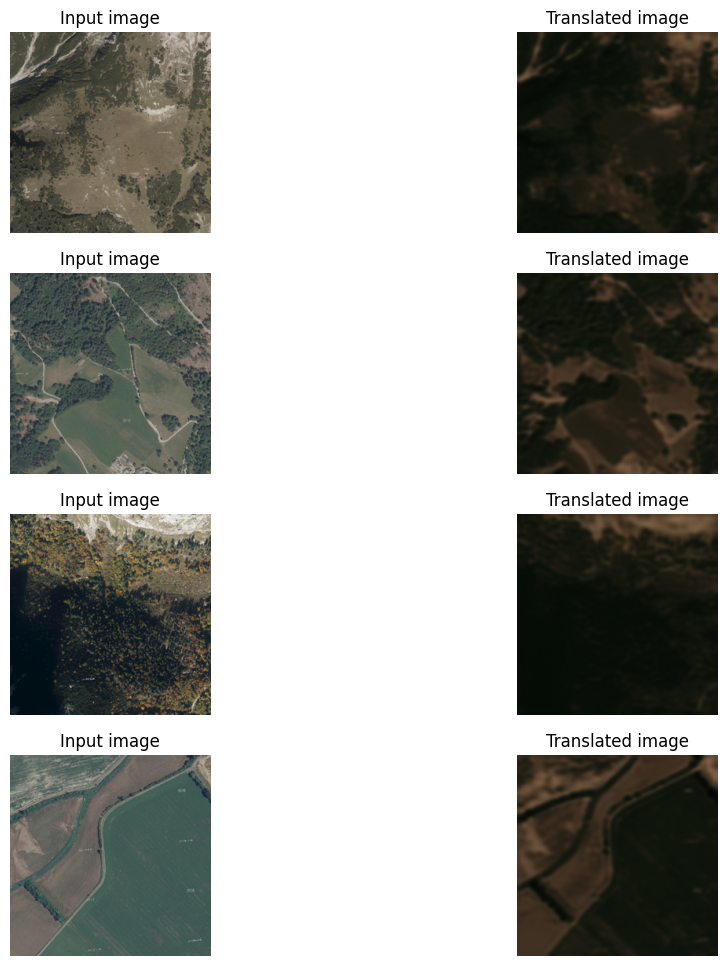

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.1950 - D_Y_loss: 0.2469 - F_loss: 2.7324 - G_loss: 0.9295
Epoch 4/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2087 - D_Y_loss: 0.2419 - F_loss: 2.3541 - G_loss: 0.8927

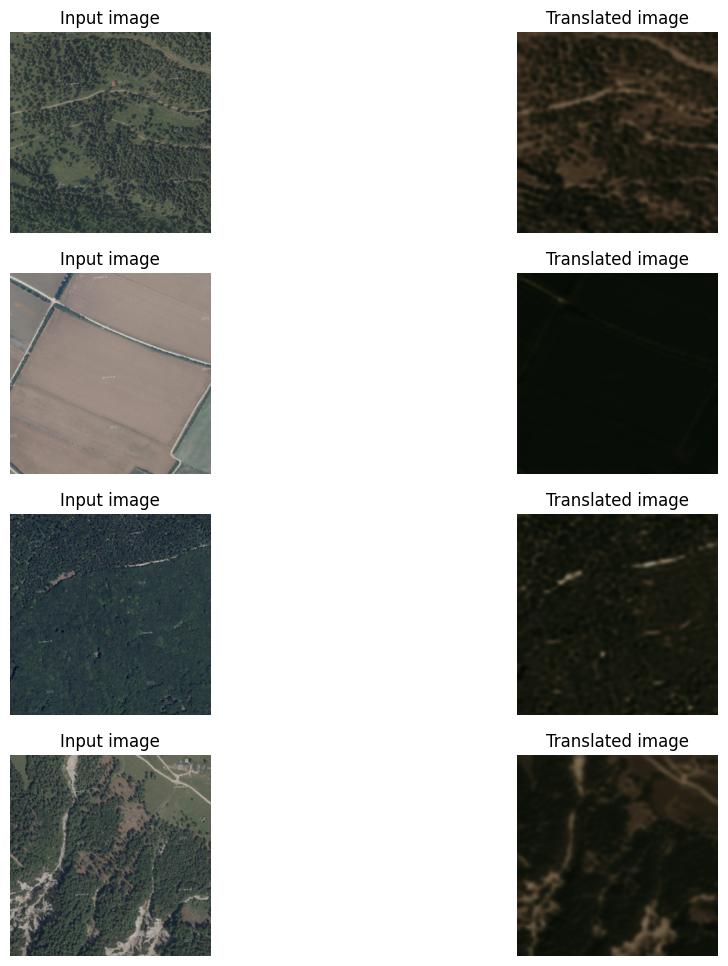

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2087 - D_Y_loss: 0.2419 - F_loss: 2.3536 - G_loss: 0.8927
Epoch 5/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2298 - D_Y_loss: 0.2464 - F_loss: 2.1796 - G_loss: 0.8187

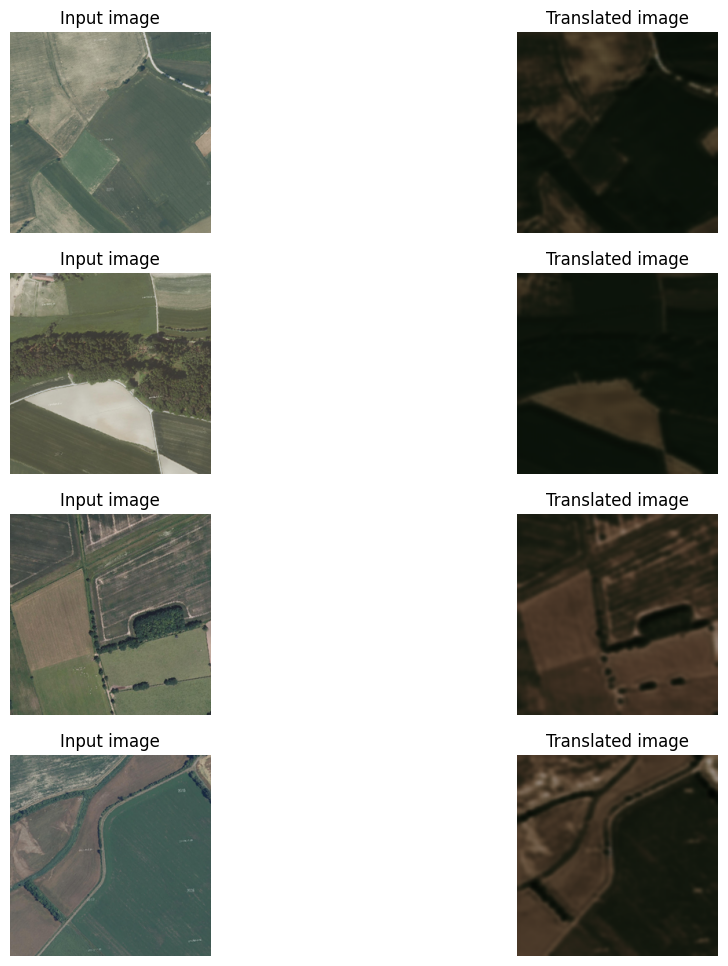

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2299 - D_Y_loss: 0.2464 - F_loss: 2.1799 - G_loss: 0.8186
Epoch 6/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2247 - D_Y_loss: 0.2464 - F_loss: 2.2421 - G_loss: 0.8287

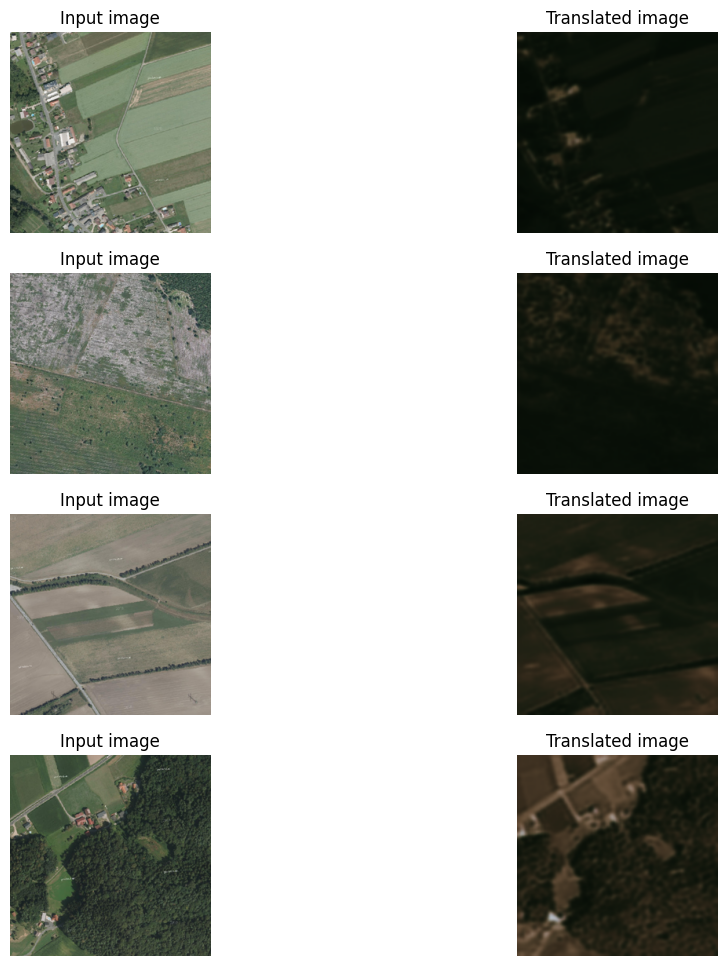

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2247 - D_Y_loss: 0.2464 - F_loss: 2.2417 - G_loss: 0.8286
Epoch 7/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2377 - D_Y_loss: 0.2457 - F_loss: 1.9993 - G_loss: 0.7872

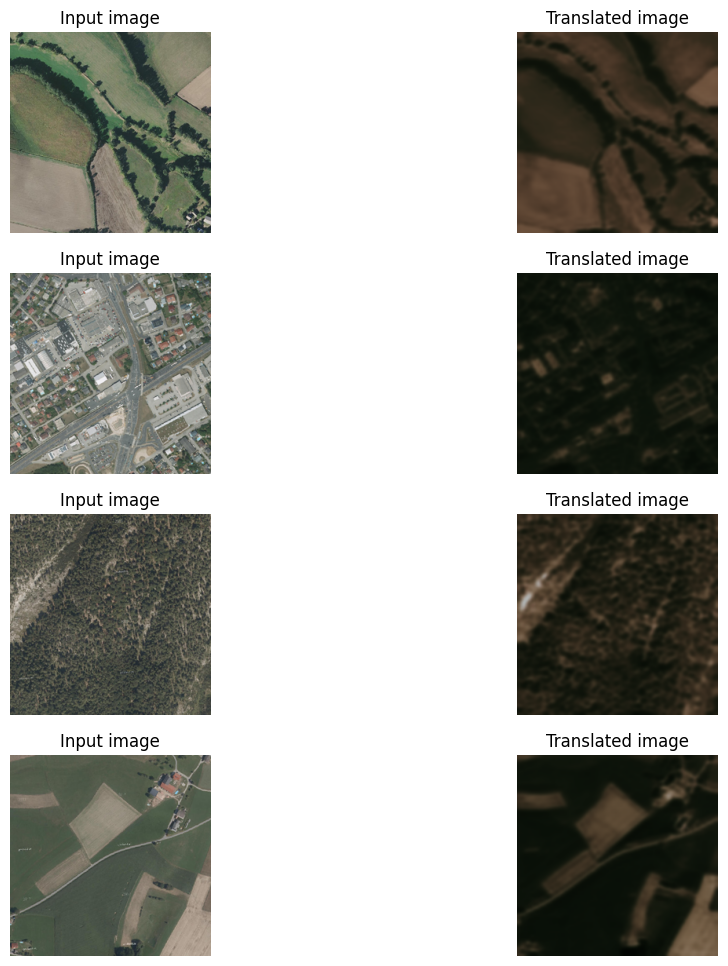

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2378 - D_Y_loss: 0.2457 - F_loss: 1.9992 - G_loss: 0.7871
Epoch 8/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2382 - D_Y_loss: 0.2491 - F_loss: 1.9995 - G_loss: 0.8185

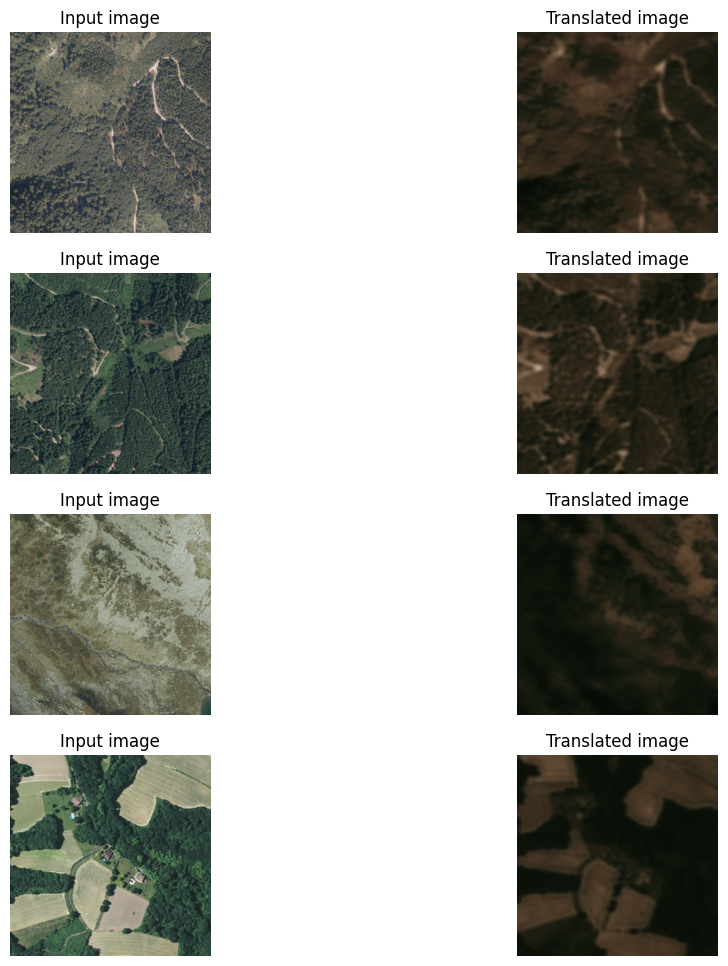

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 139s 71ms/step - D_X_loss: 0.2382 - D_Y_loss: 0.2490 - F_loss: 1.9995 - G_loss: 0.8190
Epoch 9/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2390 - D_Y_loss: 0.2475 - F_loss: 1.9528 - G_loss: 0.8468

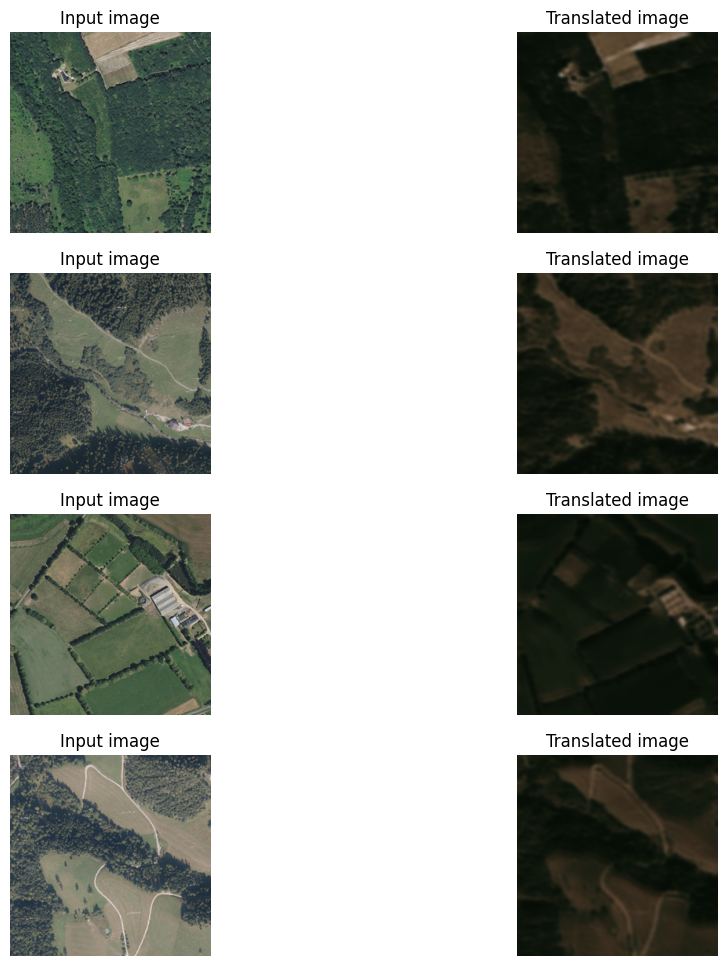

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2390 - D_Y_loss: 0.2475 - F_loss: 1.9530 - G_loss: 0.8466
Epoch 10/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2433 - D_Y_loss: 0.2465 - F_loss: 1.9436 - G_loss: 0.8523

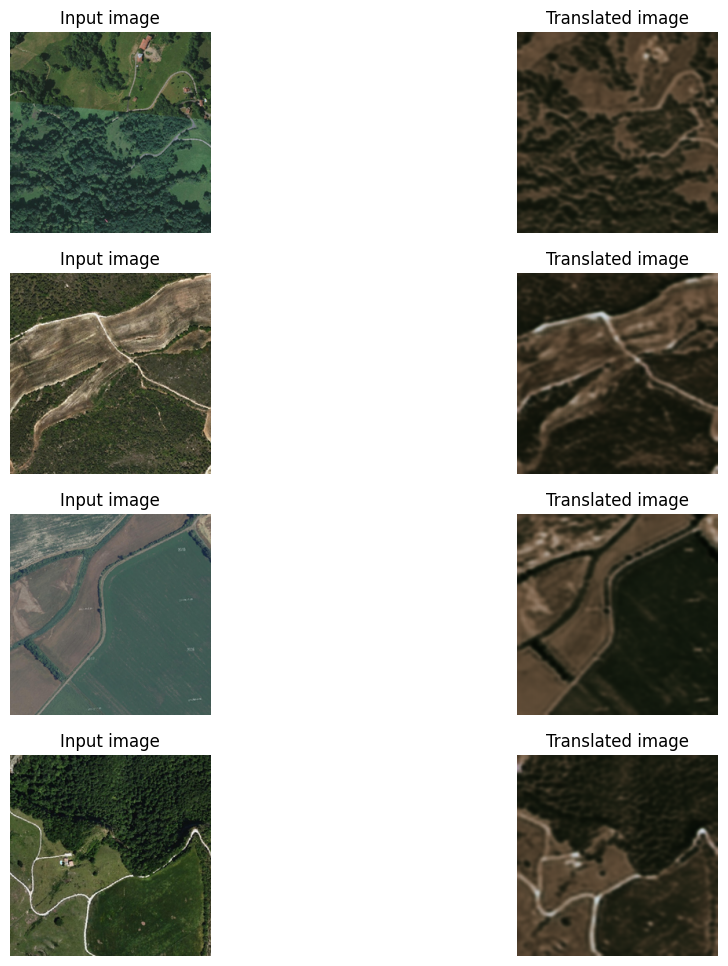

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2434 - D_Y_loss: 0.2465 - F_loss: 1.9438 - G_loss: 0.8526
Epoch 11/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2407 - D_Y_loss: 0.2477 - F_loss: 1.9015 - G_loss: 0.8401

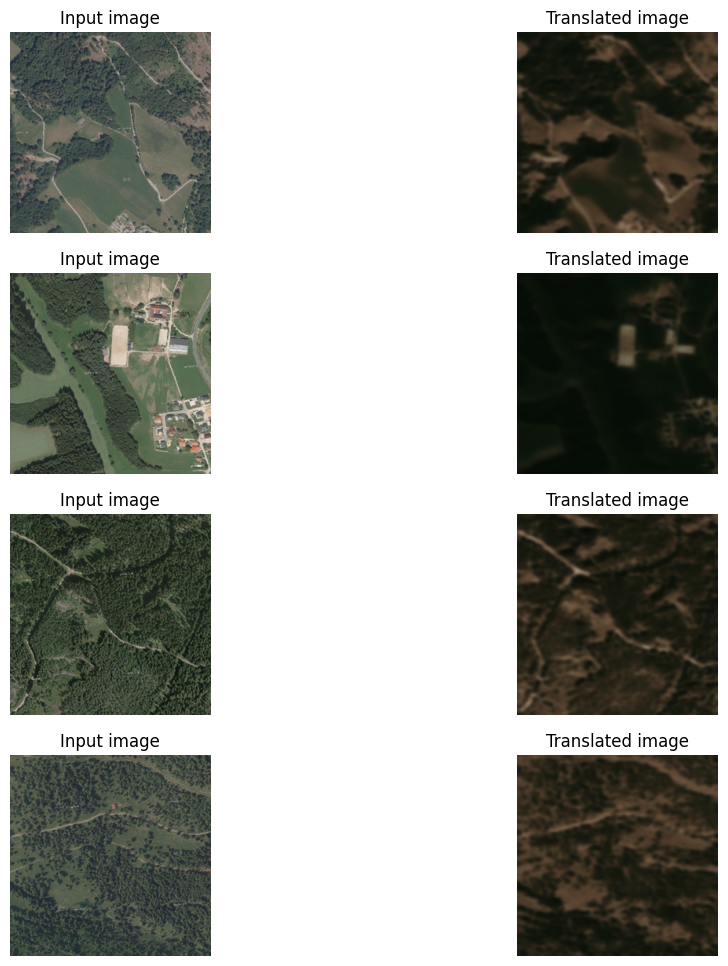

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2407 - D_Y_loss: 0.2478 - F_loss: 1.9014 - G_loss: 0.8400
Epoch 12/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2418 - D_Y_loss: 0.2476 - F_loss: 1.8766 - G_loss: 0.8324

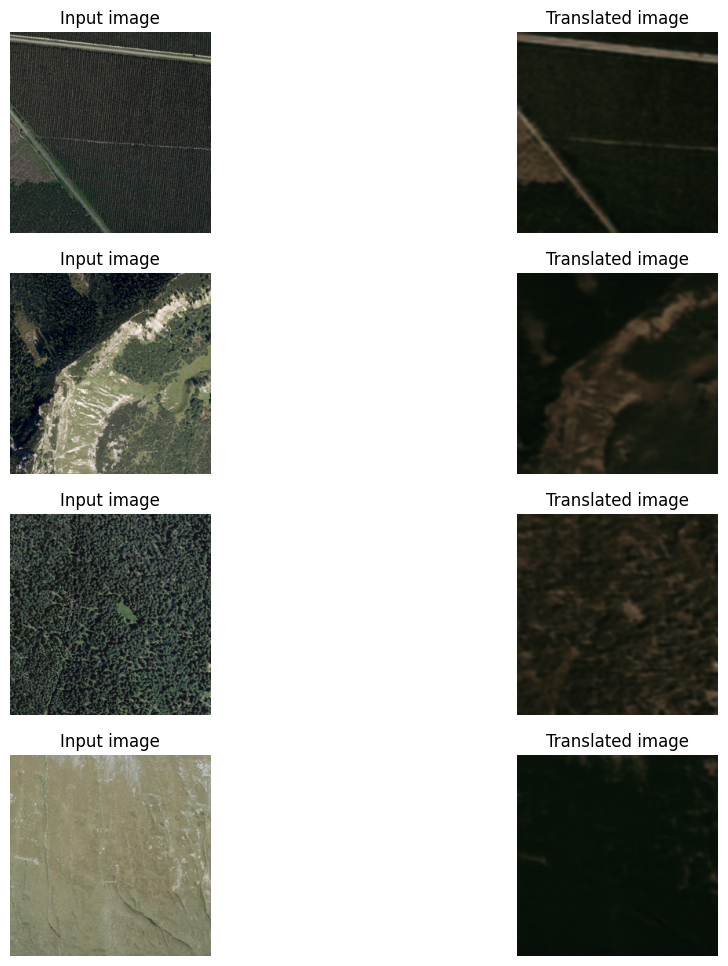

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2418 - D_Y_loss: 0.2476 - F_loss: 1.8763 - G_loss: 0.8324
Epoch 13/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2411 - D_Y_loss: 0.2459 - F_loss: 1.9269 - G_loss: 0.8839

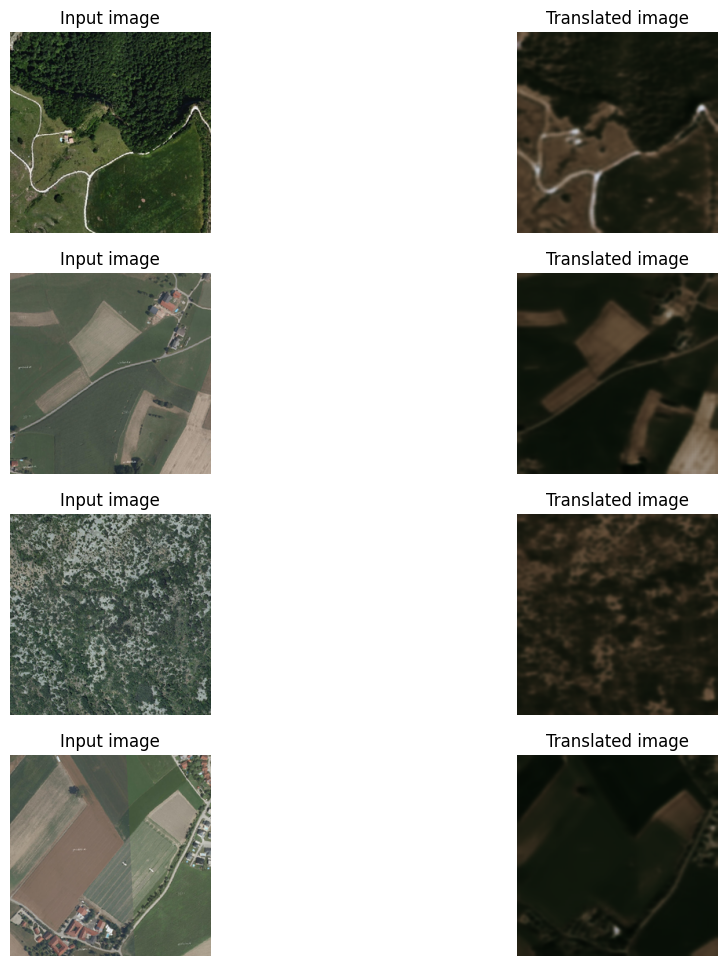

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2411 - D_Y_loss: 0.2459 - F_loss: 1.9268 - G_loss: 0.8838
Epoch 14/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2441 - D_Y_loss: 0.2464 - F_loss: 1.9686 - G_loss: 0.8989

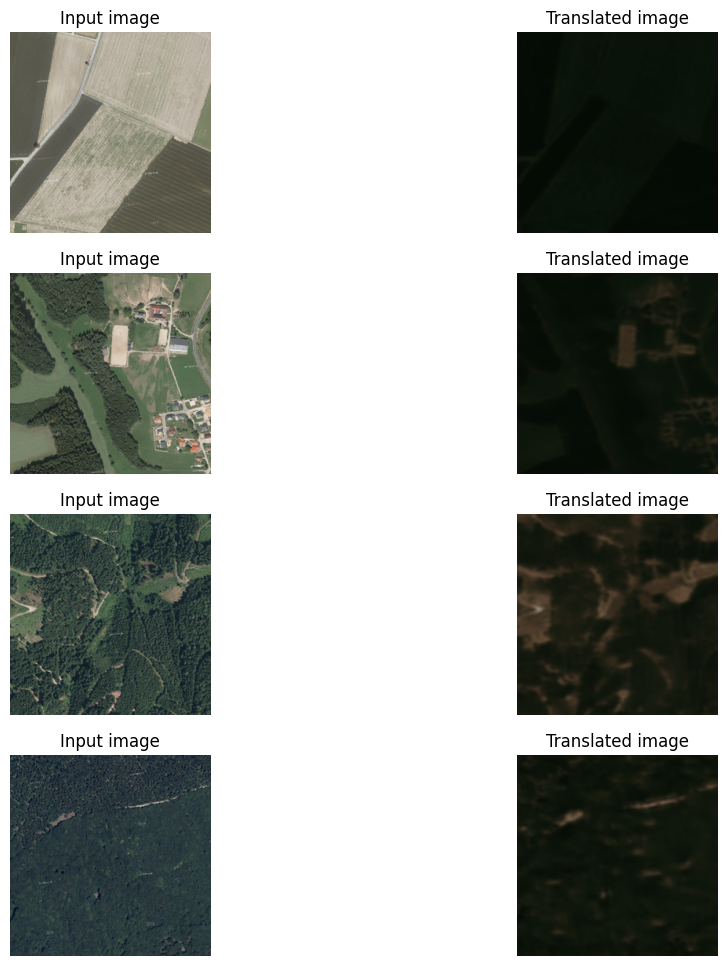

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2441 - D_Y_loss: 0.2464 - F_loss: 1.9686 - G_loss: 0.8988
Epoch 15/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2461 - D_Y_loss: 0.2475 - F_loss: 1.8866 - G_loss: 0.8472

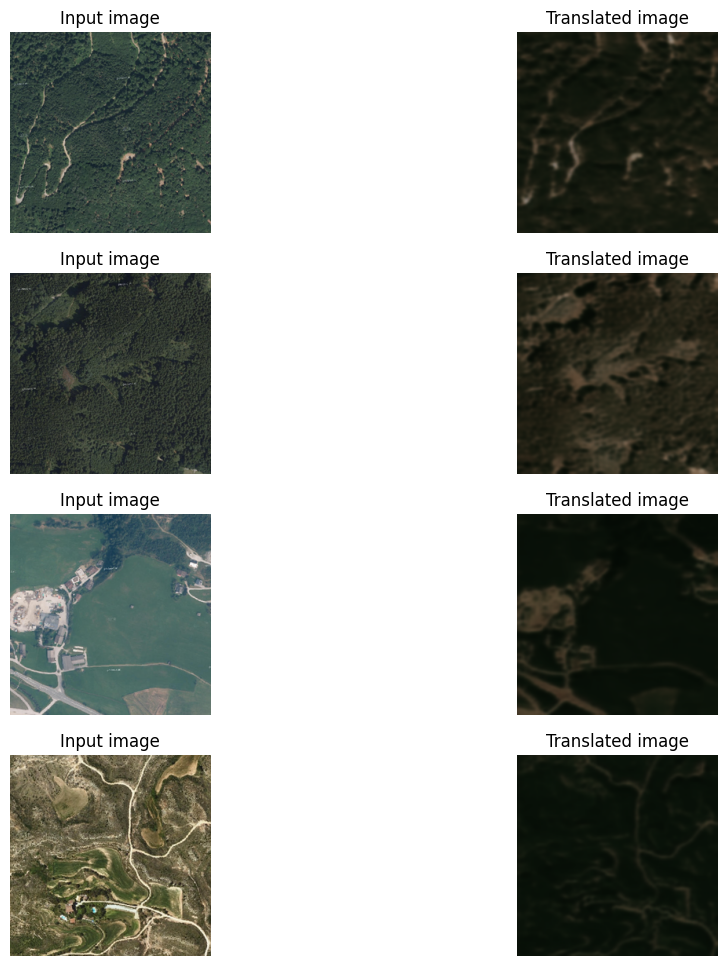

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2461 - D_Y_loss: 0.2475 - F_loss: 1.8863 - G_loss: 0.8471
Epoch 16/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2454 - D_Y_loss: 0.2474 - F_loss: 1.9399 - G_loss: 0.8420

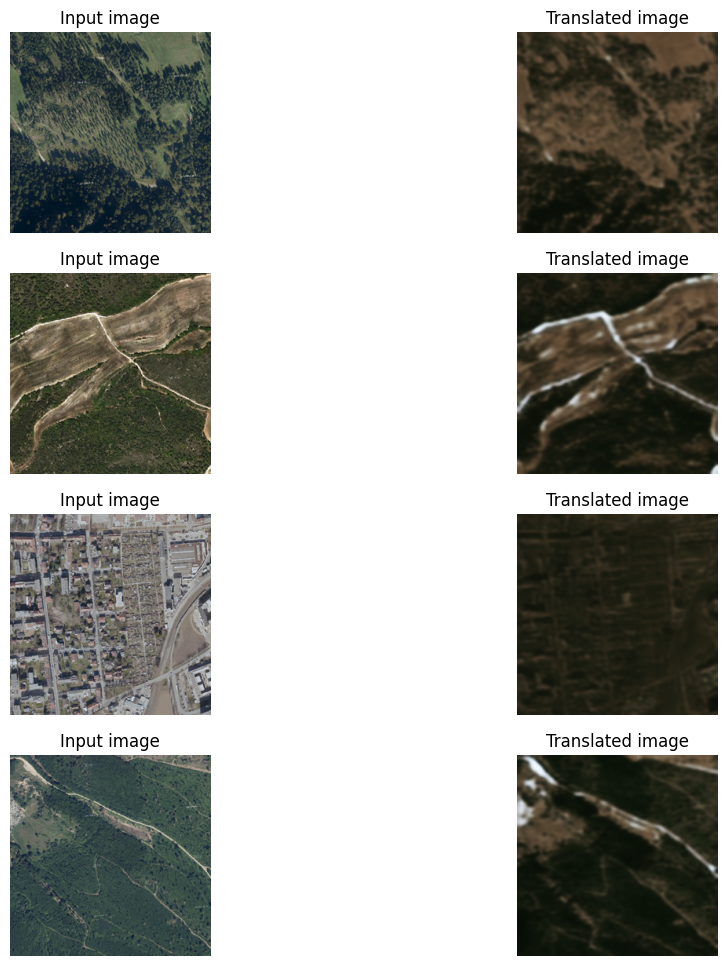

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2455 - D_Y_loss: 0.2474 - F_loss: 1.9396 - G_loss: 0.8421
Epoch 17/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2431 - D_Y_loss: 0.2471 - F_loss: 1.9356 - G_loss: 0.8469

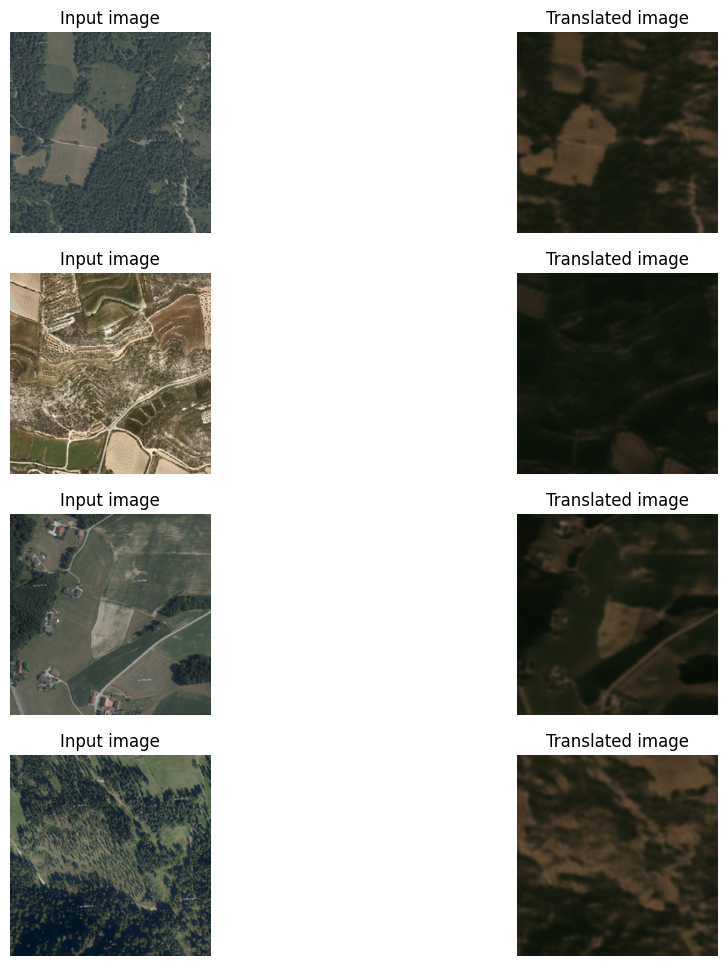

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2431 - D_Y_loss: 0.2471 - F_loss: 1.9354 - G_loss: 0.8470
Epoch 18/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2376 - D_Y_loss: 0.2476 - F_loss: 1.9466 - G_loss: 0.8659

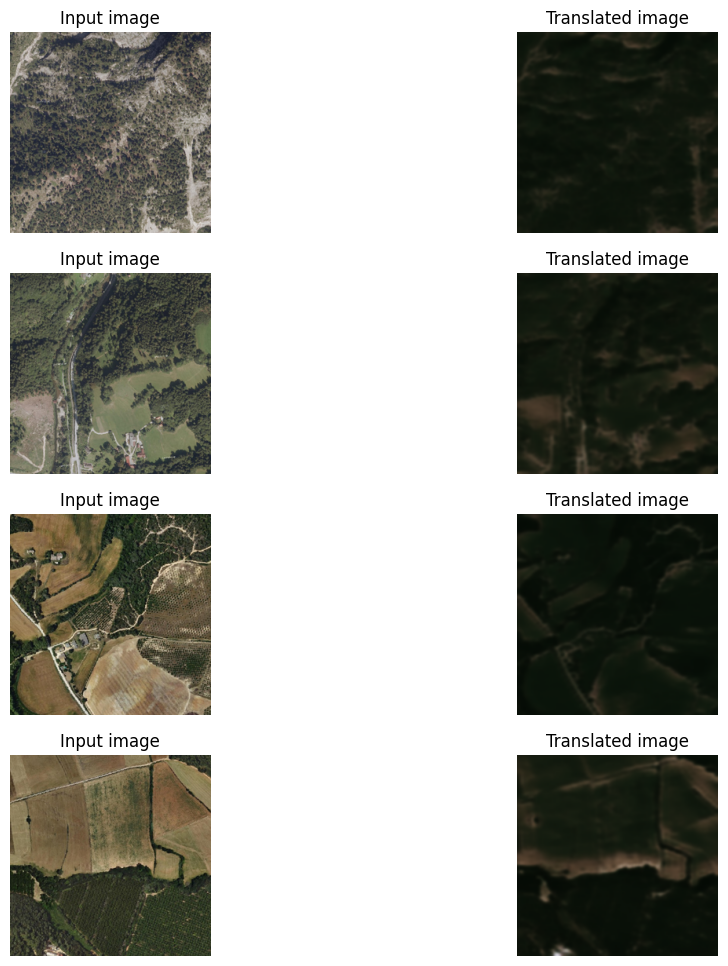

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2376 - D_Y_loss: 0.2476 - F_loss: 1.9473 - G_loss: 0.8662
Epoch 19/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2403 - D_Y_loss: 0.2483 - F_loss: 1.9398 - G_loss: 0.8832

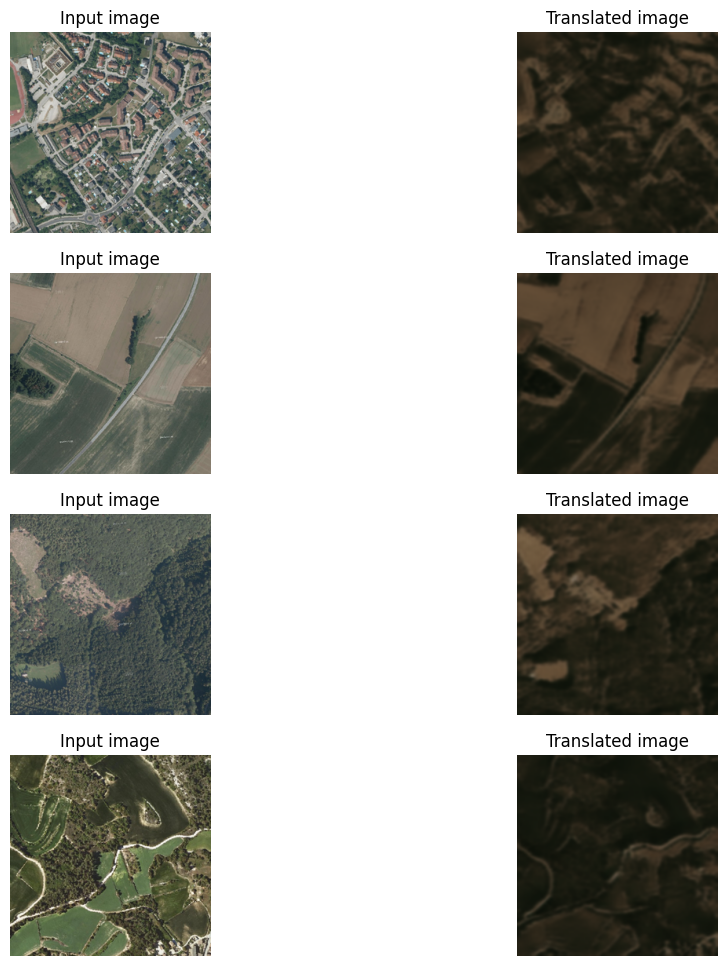

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2403 - D_Y_loss: 0.2483 - F_loss: 1.9395 - G_loss: 0.8831
Epoch 20/20
1945/1945 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - D_X_loss: 0.2396 - D_Y_loss: 0.2490 - F_loss: 1.9076 - G_loss: 0.8672

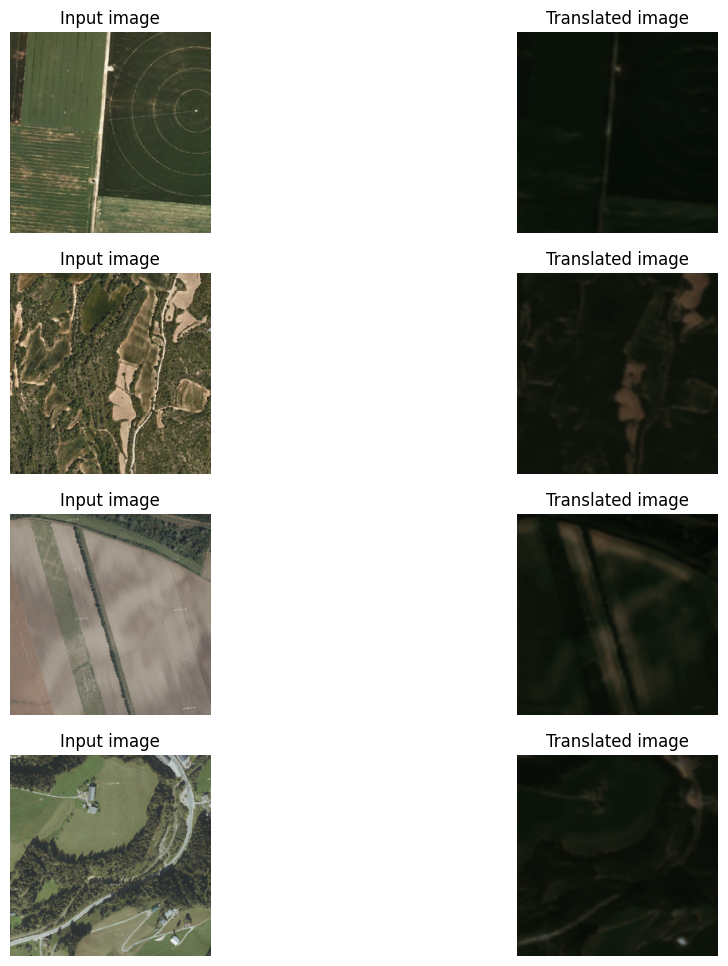

1945/1945 ━━━━━━━━━━━━━━━━━━━━ 138s 71ms/step - D_X_loss: 0.2396 - D_Y_loss: 0.2491 - F_loss: 1.9076 - G_loss: 0.8671


In [ ]:
with tf.device('/device:GPU:0'):
  cycle_gan_model.fit(
      tf.data.Dataset.zip((train_a, train_b)),
      epochs=20,
      callbacks=[plotter, model_checkpoint_callback],
  )

Weights loaded successfully


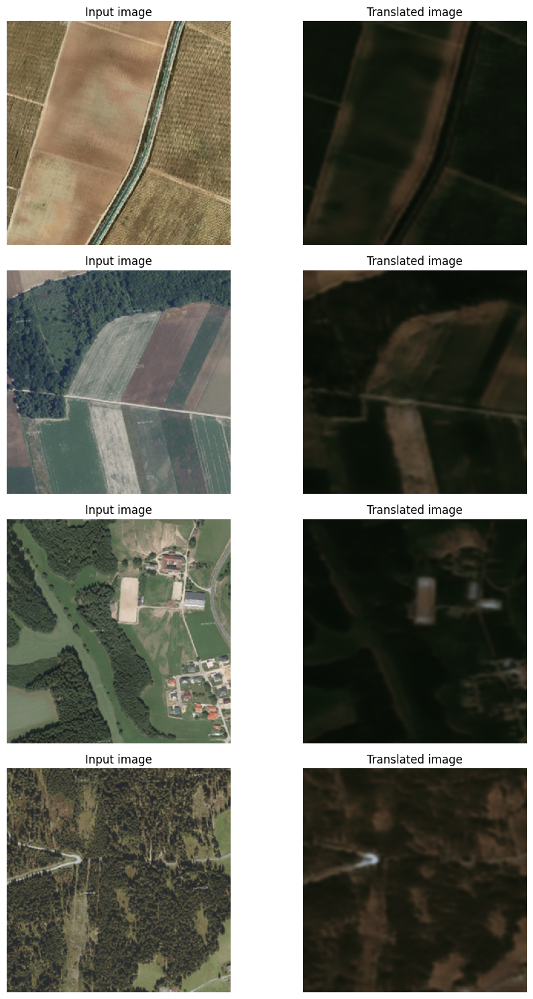

In [ ]:

# Load the checkpoints
cycle_gan_model.load_weights('./model_checkpoints/cyclegan_checkpoints.weights.h5')
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_a.take(4)):
    prediction = cycle_gan_model.gen_AB(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.utils.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

In [ ]:
!cp ./model_checkpoints/cyclegan_checkpoints.weights.h5 /content/drive/MyDrive/dissertation/datasets/cyclegan_checkpoints_v2.weights.h5

## Generate Dataset AB for finetuning Model1

In [ ]:
#generate new dataset
dataset_source = load_images('./dataset/train/a/images/')

In [ ]:
!mkdir -p ./finetuning_dataset2/train/images

In [ ]:
# Load the checkpoints
cycle_gan_model.load_weights('./model_checkpoints/cyclegan_checkpoints.weights.h5')
print("Weights loaded successfully")


num_processed = 0
batch_processed = 0

for i in range(len(dataset_source)):
    single_image_original_range = dataset_source[i]

    # 1. Convert to float32 tensor
    if not isinstance(single_image_original_range, tf.Tensor):
        single_image_tensor = tf.convert_to_tensor(single_image_original_range, dtype=tf.float32)
    else:
        single_image_tensor = tf.cast(single_image_original_range, dtype=tf.float32)

    if tf.reduce_max(single_image_tensor) > 1.0:
        image_normalized_to_0_1 = single_image_tensor / 255.0
    else:
        image_normalized_to_0_1 = single_image_tensor

    image_normalized_to_neg1_1 = (image_normalized_to_0_1 * 2.0) - 1.0
    image_batch = tf.expand_dims(image_normalized_to_neg1_1, axis=0)

    # ensure gen_AB is the correct attribute name for your generator
    prediction_output_neg1_1 = cycle_gan_model.gen_AB(image_batch, training=False)[0].numpy()

    # denormalize prediction (from [-1, 1] to [0, 255])
    prediction_denormalized_0_255 = (prediction_output_neg1_1 * 127.5 + 127.5).astype(np.uint8)

    pil_image_to_save = keras.utils.array_to_img(prediction_denormalized_0_255)
    filename = f"image_{str(i).zfill(4)}.png"
    save_path = os.path.join("./finetuning_dataset2/train/images/", filename) # Use os.path.join

    pil_image_to_save.save(save_path)

    num_processed += 1
    batch_processed +=1
    if batch_processed >= 100 or (i + 1) == len(dataset_source): # Print for last one too
      print("Processed: ", num_processed, " images. Last: ", filename)
      batch_processed = 0



Weights loaded successfully
Processed:  100  images. Last:  image_0099.png
Processed:  200  images. Last:  image_0199.png
Processed:  300  images. Last:  image_0299.png
Processed:  400  images. Last:  image_0399.png
Processed:  500  images. Last:  image_0499.png
Processed:  600  images. Last:  image_0599.png
Processed:  700  images. Last:  image_0699.png
Processed:  800  images. Last:  image_0799.png
Processed:  900  images. Last:  image_0899.png
Processed:  1000  images. Last:  image_0999.png
Processed:  1100  images. Last:  image_1099.png
Processed:  1200  images. Last:  image_1199.png
Processed:  1300  images. Last:  image_1299.png
Processed:  1400  images. Last:  image_1399.png
Processed:  1500  images. Last:  image_1499.png
Processed:  1600  images. Last:  image_1599.png
Processed:  1700  images. Last:  image_1699.png
Processed:  1800  images. Last:  image_1799.png
Processed:  1900  images. Last:  image_1899.png
Processed:  2000  images. Last:  image_1999.png
Processed:  2100  ima

In [ ]:
!ls -la ./finetuning_dataset2/train/images/ | head

total 137216
drwxr-xr-x 2 root root 73728 May 11 19:55 .
drwxr-xr-x 4 root root  4096 May 11 19:30 ..
-rw-r--r-- 1 root root 61599 May 11 19:49 image_0000.png
-rw-r--r-- 1 root root 30177 May 11 19:49 image_0001.png
-rw-r--r-- 1 root root 53839 May 11 19:49 image_0002.png
-rw-r--r-- 1 root root 47447 May 11 19:49 image_0003.png
-rw-r--r-- 1 root root 47139 May 11 19:49 image_0004.png
-rw-r--r-- 1 root root 59833 May 11 19:49 image_0005.png
-rw-r--r-- 1 root root 37773 May 11 19:49 image_0006.png


### Add masks to dataset and save it to google drive

In [ ]:
!cp -r ./dataset/train/a/masks ./finetuning_dataset2/train/

In [ ]:
!ls -la ./finetuning_dataset2/train/images/ | wc -l

2435


In [ ]:
!tar -czf ./finetuning_dataset.v2.tar.gz ./finetuning_dataset2

In [ ]:
!ls -la ./finetuning_dataset.v2.tar.gz

-rw-r--r-- 1 root root 139308205 May 11 20:02 ./finetuning_dataset.v2.tar.gz


In [ ]:
!cp ./finetuning_dataset.v2.tar.gz /content/drive/MyDrive/dissertation/datasets/finetuning_dataset.v2.tar.gz